# `Importing required libraries`

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import string
import random
from itertools import chain
from unidecode import unidecode
import copy

import plotly.express as px
import seaborn as sns 

from sklearn import linear_model
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import (confusion_matrix,
                             ConfusionMatrixDisplay,
                             precision_score, 
                             recall_score,accuracy_score, 
                             roc_auc_score, 
                             RocCurveDisplay)

# `Download dataset in working directory`

Link to download `given names + gender` dataset: https://www.behindthename.com/api/download.php

# `Feature Engineering`

## Fitting data to a pandas dataframe

In [2]:
import pandas as pd

data = pd.read_csv('btn_givennames.txt', sep = '\t', names = ['Name', 'Gender'], skiprows = 8)
df = data[data.Gender != 'mf'].reset_index(drop = True) # Remove uni-sex names as we are only concerned male or female names.

for i in range(len(df)):
    if df['Gender'][i] == 'm':
        df['Gender'][i] = int(0)
    else:
        df['Gender'][i] = int(1)
df

,Name,Gender
0,Aabraham,0
1,Aada,1
2,Aadan,0
3,Aadolf,0
4,Aafje,1
...,...,...
24590,Žydrė,1
24591,Žydrūnas,0
24592,Zygfryd,0
24593,Zygmunt,0


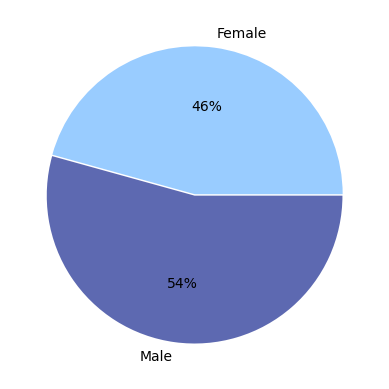

In [3]:
# declaring data
data = [len(df[df.Gender == 1])/len(df.Gender), len(df[df.Gender==0])/len(df.Gender)]
keys = ['Female', 'Male']
  
# declaring exploding pie
explode = [0, 0.01]

# plotting data on chart
plt.pie(data, labels=keys, colors=['#99CCFF','#5D69B1'],
        explode=explode, autopct='%.0f%%')
  
# displaying chart
plt.show()

## Converting special characters to ASCII equivalent

In [4]:
# Identify names with unique characters
unique_names = df[df.Name.str.match('[^a-z A-Z]')].Name.values

# Obtain unique letters, convert them to ASCII format 
name_sets = [set(name) for name in unique_names]
name_lists = [list(name) for name in name_sets]

letters = np.unique(list(chain.from_iterable(name_sets)))
unique_letters = []
for let in letters:
    if let not in list(string.ascii_letters):
        unique_letters.append(let)

unique_converted = copy.deepcopy(unique_letters)
for i in range(len(unique_converted)):
    unique_converted[i] = unidecode(unique_converted[i]) 

pd.DataFrame({'Special Characters': unique_letters, 'Special Converted': unique_converted})

,Special Characters,Special Converted
0,,
1,','
2,À,A
3,Á,A
4,Â,A
...,...,...
77,ṣ,s
78,ạ,a
79,Ọ,O
80,ọ,o


In [5]:
# Convert df['Name'] to ASCII equivalent
for i in range(len(df)):
    df['Name'][i] = unidecode(df['Name'][i])
df

,Name,Gender
0,Aabraham,0
1,Aada,1
2,Aadan,0
3,Aadolf,0
4,Aafje,1
...,...,...
24590,Zydre,1
24591,Zydrunas,0
24592,Zygfryd,0
24593,Zygmunt,0


# `One-hot encoding of names`

In [6]:
######################################################################################
############################## Begin One-Hot Encoding ################################

extra_characters = [' ', "'", 'AE', 'ae', 'Th', 'th', '@', '-', '*', '`']
all_letters = list(string.ascii_letters) + extra_characters
n_letters = len(all_letters)

max_letters = len(max(df['Name'], key = len)) # Length of largest name in the dataset. 

# Find letter index from all_letters.
def letter_to_index(letter):
    return all_letters.index(letter)

# Turn a letter into a (1 x 62) numpy array.
def letter_to_numpy(letter):
    numpy = np.zeros(n_letters)
    numpy[letter_to_index(letter)] = 1
    return numpy

# Turn a name into a (1302, ) length numpy array of one-hot letters padded with zeros.
def name_to_numpy(line):
    numpy = np.zeros((max_letters, n_letters))
    for li, letter in enumerate(line):
        numpy[li][letter_to_index(letter)] = 1
    return numpy.flatten()

############################### End One-Hot Encoding #################################
######################################################################################

np.set_printoptions(threshold=np.inf)
print('Length of name with most letters in the dataset:', max_letters)
print('\n')
print('Length of 1d vector of zeros:', n_letters)
print('\n')
print('Index of letter `J`:', letter_to_index('n'))
print('\n')
print('One-hot encoding letter `J` to numpy:\n', letter_to_numpy('J'))
print('\n')
print('Shape of `Jones` to numpy before flattening:', name_to_numpy('Jones').reshape(21,62).shape)
print('\n')
print('Shape of `Jones` to numpy after flattening:', name_to_numpy('Jones').shape)

Length of name with most letters in the dataset: 21


Length of 1d vector of zeros: 62


Index of letter `J`: 13


One-hot encoding letter `J` to numpy:
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


Shape of `Jones` to numpy before flattening: (21, 62)


Shape of `Jones` to numpy after flattening: (1302,)


In [7]:
X = [name_to_numpy(name) for name in df['Name']]
y = df['Gender'].astype(int)

## Principal Component Analysis

### 2-dimensional PCA Projection

In [8]:
pca = PCA(n_components = 2)
components = pca.fit_transform(X)

data = pd.DataFrame({'PC1': [i[0] for i in components], 'PC2': [i[1] for i in components]})

fig = px.scatter(data, 
                 x = 'PC1', 
                 y = 'PC2', 
                 color = df['Gender'], 
                 color_discrete_sequence=[px.colors.qualitative.Safe[0], px.colors.qualitative.Vivid[1]],
                 title = "2-Dimensional Principal Component Analysis (PCA) of One-Hot Encoded Names")

fig.update_traces(marker = dict(size = 3, opacity = 0.5))

fig.update_layout({'plot_bgcolor': 'rgba(0,0,0,0)',})
                              
fig.show()

### 3-dimensional PCA Projection

In [9]:
pca = PCA(n_components=3)
components = pca.fit_transform(X)

total_var = pca.explained_variance_ratio_.sum() * 100

fig = px.scatter_3d(
    components, x = 0, y = 1, z = 2, color = df['Gender'], color_discrete_sequence=[px.colors.qualitative.Safe[0], px.colors.qualitative.Vivid[1]],
    title = '3-Dimensional Principal Component Analysis (PCA) of One-Hot Encoded Names',
    labels = {'0': 'x', '1': 'y', '2': 'z'}
)
fig.update_traces(marker_size = 2, opacity = 0.5)
fig.update_layout({'plot_bgcolor': 'rgba(0,0,0,0)',})
fig.show()

# `Algorithm Selection for Best Classifier`

## Creating Training, Validation, and Test sets

In [10]:
# Split 80% for training data, 20% for validation & test
X_train, X_tmp, y_train, y_tmp = train_test_split(X, y, test_size = 0.2, random_state = 0, stratify = y)

# Split this 20% in have to get 10% validation, 10% test
X_valid, X_test, y_valid, y_test = train_test_split(X_tmp, y_tmp, test_size = 0.5, random_state = 0, stratify = y_tmp)

## Fitting Knn with optimum hyper-parameters

In [11]:
models = KNeighborsClassifier()
parameters = [{'n_neighbors': np.arange(1, 10, 2), 
              'metric': ['cosine', 'euclidean', 'manhattan']}]
               
clf = GridSearchCV(models, parameters, n_jobs = 5)
clf.fit(X_train, y_train)
print(f"Model Name: K-nearest Neighbors \nBest Hyper-parameter(s): {clf.best_params_} \nValidation Accuracy: {round(clf.score(X_valid, y_valid), 3)}\n")

Model Name: K-nearest Neighbors 
Best Hyper-parameter(s): {'metric': 'cosine', 'n_neighbors': 3} 
Validation Accuracy: 0.713



In [12]:
knn = KNeighborsClassifier(metric = 'cosine', n_neighbors = 3).fit(X_train, y_train)

knn_accuracy = accuracy_score(y_true = y_test, y_pred = knn.predict(X_test))
knn_precision = precision_score(y_true = y_test, y_pred = knn.predict(X_test))
knn_recall = recall_score(y_true = y_test, y_pred = knn.predict(X_test))
knn_auc = roc_auc_score(y_true = y_test, y_score = knn.predict_proba(X_test)[:, 1])

## Fitting logistic regression with optimum hyper-parameters

In [13]:
models = linear_model.LogisticRegression(max_iter = 5000)
parameters = [{'C': np.arange(200, 400, 10)}]

clf = GridSearchCV(models, parameters, n_jobs = 5)
clf.fit(X_train, y_train)
print(f"Model Name: Logistic Regression \nBest Hyper-parameter(s): {clf.best_params_} \nValidation Accuracy: {round(clf.score(X_valid, y_valid), 3)}\n")

Model Name: Logistic Regression 
Best Hyper-parameter(s): {'C': 370} 
Validation Accuracy: 0.719



In [14]:
logistic = linear_model.LogisticRegression(max_iter = 5000, C = 370).fit(X_train, y_train)

logistic_accuracy = accuracy_score(y_true = y_test, y_pred = logistic.predict(X_test))
logistic_precision = precision_score(y_true = y_test, y_pred = logistic.predict(X_test))
logistic_recall = recall_score(y_true = y_test, y_pred = logistic.predict(X_test))
logistic_auc = roc_auc_score(y_true=y_test, y_score=logistic.predict_proba(X_test)[:, 1])

## Fitting decision trees classifier

In [15]:
decision_tree = DecisionTreeClassifier(criterion = 'entropy').fit(X_train,y_train)

tree_accuracy = accuracy_score(y_true = y_test, y_pred = decision_tree.predict(X_test))
tree_precision = precision_score(y_true = y_test, y_pred = decision_tree.predict(X_test))
tree_recall = recall_score(y_true = y_test, y_pred = decision_tree.predict(X_test))
tree_auc = roc_auc_score(y_true=y_test, y_score=decision_tree.predict_proba(X_test)[:, 1])

## Reporting validation accuracies

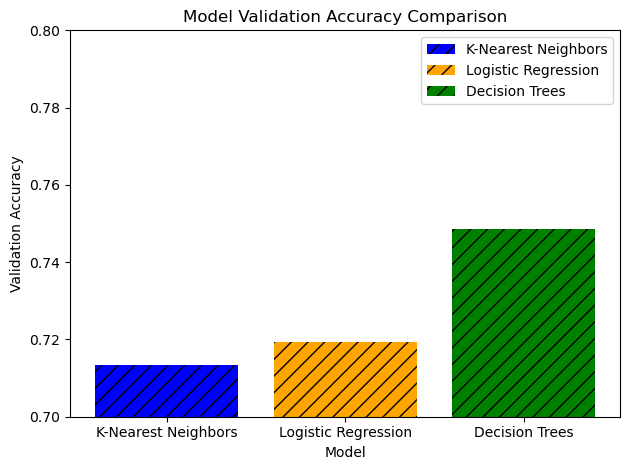

In [16]:
# Validation accuracies
accuracies = [knn.score(X_valid, y_valid), logistic.score(X_valid, y_valid), decision_tree.score(X_valid, y_valid)]

# Model names
models = ['K-Nearest Neighbors', 'Logistic Regression', 'Decision Trees']

# Colors (highlighting Decision Trees)
colors = ['blue', 'orange', 'green']

# Bar positions
positions = np.arange(len(models))

# Create bars
bars = plt.bar(positions, accuracies, color=colors, hatch='//')

# Adding legends to indicate the models
plt.legend(bars, models)

plt.xlabel('Model')
plt.ylabel('Validation Accuracy')
plt.title('Model Validation Accuracy Comparison')
plt.xticks(positions, models)
plt.ylim(0.7, 0.8) # Adjust the y-axis limits if needed

plt.tight_layout()
plt.show()

## Fitting Gradient Boosting Model

In [17]:
clf = GradientBoostingClassifier(n_estimators = 10000, learning_rate = 1.0, random_state = 0).fit(X_train, y_train)

gradient_accuracy = accuracy_score(y_true = y_test, y_pred = clf.predict(X_test))
gradient_precision = precision_score(y_true = y_test, y_pred = clf.predict(X_test))
gradient_recall = recall_score(y_true = y_test, y_pred = clf.predict(X_test))
gradient_auc = roc_auc_score(y_true = y_test, y_score = clf.predict_proba(X_test)[:, 1])

## Reporting Gradient Boosting validation accuracy

In [18]:
print('Gradient Boosting validation accuracy:', clf.score(X_valid, y_valid))

Gradient Boosting validation accuracy: 0.793818625457503


# `Model Performance Assesment`

## Comparing accuracy, precision, recall, and AUC

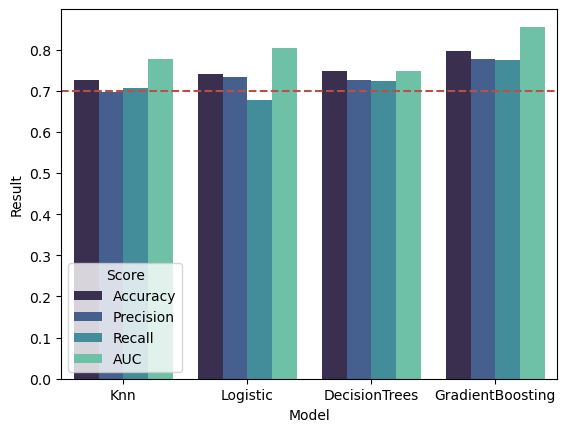

In [19]:
df = pd.DataFrame({'Model': np.repeat(['Knn', 'Logistic', 'DecisionTrees', 'GradientBoosting'], 4),
                   'Score': np.tile(['Accuracy', 'Precision', 'Recall', 'AUC'], 4),
                   'Result': [knn_accuracy, 
                              knn_precision, 
                              knn_recall, 
                              knn_auc, 
                              logistic_accuracy, 
                              logistic_precision, 
                              logistic_recall, 
                              logistic_auc, 
                              tree_accuracy, 
                              tree_precision, 
                              tree_recall,
                              tree_auc, 
                              gradient_accuracy,
                              gradient_precision,
                              gradient_recall,
                              gradient_auc]})

sns.barplot(x = 'Model', y = 'Result', hue = 'Score', data = df, palette = 'mako').axhline(0.7, color = '#BA4F45', linestyle = 'dashed')
plt.savefig('Model_Accuracies.png')

## Plotting AUC curve and Confusion Matrix

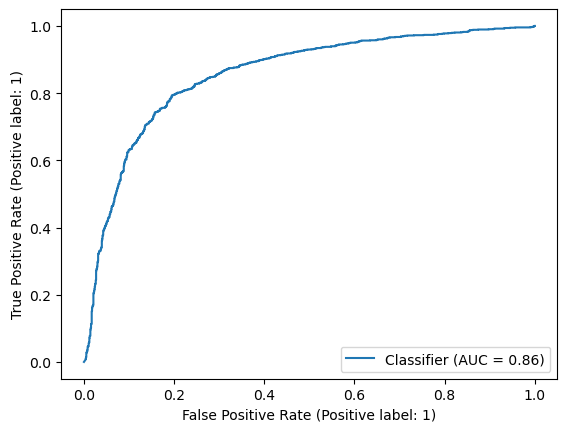

In [20]:
# Display curve
RocCurveDisplay.from_predictions(y_true = y_test, y_pred = clf.predict_proba(X_test)[:, 1])
plt.show(block = False)

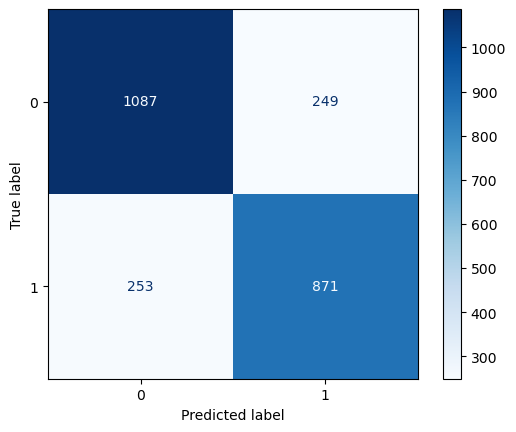

In [21]:
# Confusion Matrix
confusion_matrix  = confusion_matrix(y_true = y_test, y_pred = clf.predict(X_test))
disp = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = clf.classes_)
disp.plot(cmap = plt.cm.Blues)
plt.show()

# `Making predictions using random names`

In [22]:
names = ['John', 'Elizabeth', 'Kyle', 'Jason', 'Sydney', 'Patricia'] # True_values: 0, 1, 0, 0, 1, 1
X_new = [name_to_numpy(name) for name in names]

In [23]:
print('Predicted Genders of random names:', clf.predict(X_new))

Predicted Genders of random names: [0 1 0 0 1 1]
